# Detección de separaciones — Pipeline AMDD

Inspirado en el pipeline AMDD (Adaptive Multi-scale Difference Detection).

## Tipos de separación detectados
| Tipo | Descripción | Color bbox |
|---|---|---|
| `gap` | Separación física con fondo blanco visible | 🔴 Rojo |
| `overlap` | Borde de pieza superior sobre inferior (goma solapada) | 🟣 Violeta |
| `gap+overlap` | Combinación de ambos en la misma separación | 🟠 Naranja |

## Características detectadas
- **Bounding box** ajustado a cada separación
- **Continuidad** (% del strip que cubre la separación)
- **COMPLETA / PARCIAL** (si la separación no atraviesa todo el strip)
- **Segmentos activos** (rangos de filas donde la separación es visible)

## Pipeline
```
Imagen → Segmentar strips → Para cada strip:
           ├─ Multi-scale ESM (3 resoluciones)
           ├─ A: Bright-gap threshold (>130) → gaps blancos
           └─ B: ESM peaks (>80 fuerza) → bordes de solapamiento
                    └─ Filtros: continuidad, rubber ambos lados, brillo mínimo
           └─ Merge gap+overlap adyacentes → bounding box final
```

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import os
import glob
from scipy.signal import find_peaks

IMAGE_PATH   = "../../data/michelin_dataset/Multimedia (31).jpg"
DATASET_PATH = "../../data/michelin_dataset"

# ── Parámetros ────────────────────────────────────────────────────────────
RUBBER_DARK_THRESH   = 80    # píxeles < this = goma oscura
MIN_STRIP_AREA       = 50000 # área mínima de strip de goma
ESM_SCALES           = [1.0, 0.5, 0.25]  # escalas multi-resolución

BRIGHT_GAP_THRESH    = 130   # umbral para gap blanco visible
OVERLAP_BRIGHT_MIN   = 90    # brillo mínimo para overlap (descarta pliegues)
MIN_VERT_SPAN        = 0.20  # continuidad mínima (fracción de la altura del strip)
MAX_SEP_WIDTH        = 100   # anchura máxima de separación en px
CONTEXT_PAD          = 50    # px de contexto para verificar goma en ambos lados
MIN_RUBBER_DARK      = 0.20  # fracción mínima de goma oscura a cada lado
GAP_MERGE_DIST       = 60    # distancia máxima para fusionar gap+overlap

## Módulo 1 — Segmentación de strips

In [ ]:
def segment_rubber_strips(gray,
                           dark_thresh=RUBBER_DARK_THRESH,
                           min_area=MIN_STRIP_AREA):
    """
    Segmenta los strips de goma como los contornos oscuros más grandes.
    Usa MORPH_CLOSE con kernel grande para que las separaciones internas
    no fragmenten el contorno del strip.
    """
    _, dark = cv2.threshold(gray, dark_thresh, 255, cv2.THRESH_BINARY_INV)
    k1 = np.ones((25, 25), np.uint8)
    k2 = np.ones((10, 10), np.uint8)
    closed = cv2.morphologyEx(dark, cv2.MORPH_CLOSE, k1, iterations=3)
    opened = cv2.morphologyEx(closed, cv2.MORPH_OPEN,  k2, iterations=2)
    cnts, _ = cv2.findContours(opened, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    strips = []
    for cnt in cnts:
        if cv2.contourArea(cnt) < min_area:
            continue
        x, y, w, h = cv2.boundingRect(cnt)
        strips.append({
            'bbox': (x, y, w, h),
            'orientation': 'horizontal' if w >= h else 'vertical'
        })
    strips.sort(key=lambda s: s['bbox'][1] * 10000 + s['bbox'][0])
    return strips


print("Módulo 1 listo.")

Módulo 1 listo.


## Módulo 2 — Multi-scale ESM (Edge Strength Map)

In [ ]:
def multiscale_esm(gray_roi, scales=ESM_SCALES):
    """
    Calcula el Edge Strength Map (ESM) y Edge Direction Maps (EDM)
    a múltiples resoluciones y los fusiona.

    Multi-scale permite capturar:
    - Escala 1.0: bordes finos (separaciones estrechas)
    - Escala 0.5: bordes medios
    - Escala 0.25: bordes gruesos (separaciones anchas)
    """
    H_r, W_r = gray_roi.shape
    esm   = np.zeros((H_r, W_r), dtype=np.float32)
    edm_x = np.zeros((H_r, W_r), dtype=np.float32)
    edm_y = np.zeros((H_r, W_r), dtype=np.float32)

    for scale in scales:
        sw, sh = max(1, int(W_r * scale)), max(1, int(H_r * scale))
        small = (
            cv2.resize(gray_roi, (sw, sh), interpolation=cv2.INTER_AREA)
            if scale != 1.0 else gray_roi.copy()
        )
        # Preprocessing: Gaussian smoothing + contrast normalization (CLAHE)
        blur  = cv2.GaussianBlur(small, (5, 5), 1.0)
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(4, 4))
        enh   = clahe.apply(blur)

        # Sobel gradients
        gx  = cv2.Sobel(enh, cv2.CV_32F, 1, 0, ksize=3)
        gy  = cv2.Sobel(enh, cv2.CV_32F, 0, 1, ksize=3)
        mag = np.sqrt(gx**2 + gy**2)

        if scale != 1.0:
            mag = cv2.resize(mag, (W_r, H_r), interpolation=cv2.INTER_LINEAR)
            gx  = cv2.resize(gx,  (W_r, H_r), interpolation=cv2.INTER_LINEAR)
            gy  = cv2.resize(gy,  (W_r, H_r), interpolation=cv2.INTER_LINEAR)

        esm   += mag
        edm_x += gx
        edm_y += gy

    n = len(scales)
    return esm / n, edm_x / n, edm_y / n


print("Módulo 2 listo.")

Módulo 2 listo.


## Módulo 3 — Detección de separaciones

In [ ]:
def _active_segments(row_active, H_r):
    """Devuelve lista de (start, end) de segmentos activos consecutivos."""
    segs, in_s, s0 = [], False, 0
    for r, act in enumerate(row_active):
        if act and not in_s:    in_s = True;  s0 = r
        elif not act and in_s:  in_s = False; segs.append((s0, r))
    if in_s: segs.append((s0, H_r))
    return segs


def detect_separations_amdd(gray_roi, esm, edm_x, edm_y,
                              bright_gap_thresh=BRIGHT_GAP_THRESH,
                              overlap_bright_min=OVERLAP_BRIGHT_MIN,
                              min_vert_span=MIN_VERT_SPAN,
                              max_sep_width=MAX_SEP_WIDTH,
                              context_pad=CONTEXT_PAD,
                              min_rubber_dark=MIN_RUBBER_DARK,
                              gap_merge_dist=GAP_MERGE_DIST):
    """
    Detecta separaciones entre piezas de goma usando dos estrategias complementarias:

    A) Bright-gap: umbral alto (>bright_gap_thresh) en el ROI → aísla zonas blancas
       → componentes conectadas verticalmente → separaciones físicas con fondo blanco

    B) ESM peaks: picos en el perfil de columnas del ESM no cubiertos por A
       → con brillo > overlap_bright_min (descarta pliegues oscuros de la misma goma)
       → bordes de piezas solapadas

    Filtros comunes:
      - Continuidad vertical mínima (min_vert_span)
      - Anchura máxima (max_sep_width)
      - Goma oscura en ambos lados (min_rubber_dark)
      - No en el borde de la imagen

    Returns:
        separations: lista de dicts con 'x_center', 'x_left', 'x_right',
                     'width_px', 'true_continuity', 'is_complete',
                     'sep_type' ('gap'|'overlap'|'gap+overlap'),
                     'active_segments', 'mean_bright'
        bright_closed: imagen binaria de zonas brillantes (para debug)
    """
    H_r, W_r = gray_roi.shape
    separations = []

    # ── A: Bright-gap ─────────────────────────────────────────────────────
    _, bright_bin = cv2.threshold(gray_roi, bright_gap_thresh, 255, cv2.THRESH_BINARY)
    k_v = np.ones((20, 1), np.uint8)
    bright_closed = cv2.morphologyEx(bright_bin, cv2.MORPH_CLOSE, k_v, iterations=4)

    n_lbl, labels, stats, _ = cv2.connectedComponentsWithStats(bright_closed)

    for lbl in range(1, n_lbl):
        x = stats[lbl, cv2.CC_STAT_LEFT]
        w = stats[lbl, cv2.CC_STAT_WIDTH]
        h = stats[lbl, cv2.CC_STAT_HEIGHT]
        if h / H_r < min_vert_span:  continue
        if w > max_sep_width:         continue
        if x < 8 or x + w > W_r - 8: continue

        lz = gray_roi[:, max(0, x - context_pad):x]
        rz = gray_roi[:, x + w:min(W_r, x + w + context_pad)]
        if lz.size == 0 or rz.size == 0: continue
        ld = np.sum(lz < 80) / (lz.size + 1e-6)
        rd = np.sum(rz < 80) / (rz.size + 1e-6)
        if ld < min_rubber_dark or rd < min_rubber_dark: continue

        mask = (labels == lbl)
        row_active = mask.any(axis=1)
        true_cont  = float(np.sum(row_active) / H_r)
        segs       = _active_segments(row_active, H_r)
        mean_br    = float(gray_roi[mask].mean()) if mask.any() else 0

        separations.append({
            'x_center': int(x + w // 2), 'x_left': int(x), 'x_right': int(x + w),
            'width_px': int(w), 'vert_span': h / H_r,
            'true_continuity': true_cont, 'is_complete': true_cont > 0.65,
            'sep_type': 'gap', 'mean_bright': mean_br,
            'active_segments': segs, 'left_dark': float(ld), 'right_dark': float(rd),
        })

    # ── B: ESM overlap peaks ──────────────────────────────────────────────
    esm_col = esm.mean(axis=0)
    esm_sm  = cv2.GaussianBlur(
        esm_col.reshape(1, -1).astype(np.float32), (1, 31), 6
    ).flatten()
    esm_peaks, _ = find_peaks(esm_sm, height=80, distance=30, prominence=30)

    for px in esm_peaks:
        if any(abs(px - s['x_center']) < gap_merge_dist for s in separations):
            continue

        col_bright = float(gray_roi[:, max(0, px-8):min(W_r, px+9)].mean())
        if col_bright < overlap_bright_min: continue  # pliegue oscuro, ignorar
        if col_bright > bright_gap_thresh:  continue  # es un gap, ya cubierto

        esm_win    = esm[:, max(0, px-5):min(W_r, px+6)].max(axis=1)
        row_active = esm_win > 50
        cont       = float(np.sum(row_active) / H_r)
        if cont < min_vert_span: continue

        lz = gray_roi[:, max(0, px - context_pad):px]
        rz = gray_roi[:, px:min(W_r, px + context_pad)]
        if lz.size == 0 or rz.size == 0: continue
        ld = np.sum(lz < 80) / (lz.size + 1e-6)
        rd = np.sum(rz < 80) / (rz.size + 1e-6)
        if ld < min_rubber_dark or rd < min_rubber_dark: continue

        segs = _active_segments(row_active, H_r)

        separations.append({
            'x_center': int(px),
            'x_left': max(0, int(px - 4)), 'x_right': min(W_r, int(px + 4)),
            'width_px': 8, 'vert_span': cont,
            'true_continuity': cont, 'is_complete': cont > 0.65,
            'sep_type': 'overlap', 'mean_bright': col_bright,
            'active_segments': segs, 'left_dark': float(ld), 'right_dark': float(rd),
        })

    # ── Merge gap + adjacent overlap ──────────────────────────────────────
    separations.sort(key=lambda s: s['x_center'])
    merged = []
    for s in separations:
        if (merged
                and abs(s['x_center'] - merged[-1]['x_center']) < gap_merge_dist
                and s['sep_type'] != merged[-1]['sep_type']):
            prev = merged[-1]
            merged[-1] = {
                **prev,
                'x_left':  min(prev['x_left'],  s['x_left']),
                'x_right': max(prev['x_right'], s['x_right']),
                'width_px': (max(prev['x_right'], s['x_right'])
                             - min(prev['x_left'], s['x_left'])),
                'sep_type': 'gap+overlap',
                'true_continuity': max(prev['true_continuity'], s['true_continuity']),
                'is_complete': prev['is_complete'] or s['is_complete'],
            }
        else:
            merged.append(s)

    return merged, bright_closed


print("Módulo 3 listo.")

Módulo 3 listo.


## Módulo 4 — Pipeline principal

In [ ]:
SEP_COLORS = {
    'gap':         (255,  50,  50),
    'overlap':     (180,  80, 255),
    'gap+overlap': (255, 120,   0),
}

def detect_separations(image_path, show=True):
    """
    Pipeline completo. Detecta separaciones entre trozos de goma dentro de cada strip.
    NO detecta el gap horizontal entre strips distintos.

    Returns:
        img_rgb  : imagen RGB
        strips   : lista de strips segmentados
        all_seps : lista global de separaciones (con coordenadas absolutas)
    """
    img_bgr = cv2.imread(image_path)
    if img_bgr is None:
        raise FileNotFoundError(image_path)
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    gray    = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    H_img, W_img = gray.shape

    strips  = segment_rubber_strips(gray)
    all_seps = []

    for i, strip in enumerate(strips):
        x0, y0, w, h = strip['bbox']
        roi       = gray[y0:y0+h, x0:x0+w]
        esm, edm_x, edm_y = multiscale_esm(roi)
        seps, _   = detect_separations_amdd(roi, esm, edm_x, edm_y)

        for s in seps:
            all_seps.append({
                **s,
                'strip_idx': i,
                'abs_x0': x0 + s['x_left']  - 6,
                'abs_x1': x0 + s['x_right'] + 6,
                'abs_y0': y0,
                'abs_y1': y0 + h,
            })

    if show:
        _visualize(img_rgb, strips, all_seps, os.path.basename(image_path))

    return img_rgb, strips, all_seps


def _visualize(img_rgb, strips, all_seps, title):
    H, W = img_rgb.shape[:2]
    overlay = img_rgb.copy()

    for i, s in enumerate(strips):
        x, y, w, h = s['bbox']
        cv2.rectangle(overlay, (x, y), (x+w, y+h), (255, 200, 0), 2)
        cv2.putText(overlay, f'S{i}', (x+5, y+28),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 200, 0), 2)

    for sep in all_seps:
        col = SEP_COLORS.get(sep['sep_type'], (200, 200, 200))
        x0b = max(0, sep['abs_x0'])
        x1b = min(W-1, sep['abs_x1'])
        y0b, y1b = sep['abs_y0'], sep['abs_y1']

        # Semitransparent fill
        sub  = overlay[y0b:y1b, x0b:x1b].copy()
        fill = np.full_like(sub, col)
        overlay[y0b:y1b, x0b:x1b] = cv2.addWeighted(sub, 0.45, fill, 0.55, 0)
        cv2.rectangle(overlay, (x0b, y0b), (x1b, y1b), col, 4)

        lbl = f"{sep['sep_type']} {sep['width_px']}px {sep['true_continuity']:.0%}"
        if not sep['is_complete']: lbl += ' PARCIAL'
        cv2.putText(overlay, lbl, (x0b+5, y0b+55),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.75, col, 2)

    fig, axes = plt.subplots(1, 2, figsize=(16, 8))
    axes[0].imshow(overlay)
    n_gap = sum(1 for s in all_seps if 'gap' in s['sep_type'])
    n_ovl = sum(1 for s in all_seps if 'overlap' in s['sep_type'])
    axes[0].set_title(
        f'{title}\n'
        f'{len(all_seps)} separaciones: {n_gap} gap | {n_ovl} overlap',
        fontsize=10, fontweight='bold'
    )
    axes[0].axis('off')

    # Summary table
    axes[1].axis('off')
    if all_seps:
        cols_h = ['Strip', 'Tipo', 'x_abs', 'Ancho(px)', 'Continuidad', 'Estado']
        rows   = []
        for s in all_seps:
            rows.append([
                str(s['strip_idx']),
                s['sep_type'],
                str((s['abs_x0'] + s['abs_x1']) // 2),
                str(s['width_px']),
                f"{s['true_continuity']:.0%}",
                'COMPLETA' if s['is_complete'] else 'PARCIAL',
            ])
        tbl = axes[1].table(cellText=rows, colLabels=cols_h,
                             cellLoc='center', loc='center')
        tbl.auto_set_font_size(False)
        tbl.set_fontsize(9)
        tbl.scale(1, 2.0)
    axes[1].set_title('Resumen', fontsize=10, fontweight='bold')
    plt.tight_layout()
    plt.show()


print("Módulo 4 listo.")

Módulo 4 listo.


## Test sobre una imagen

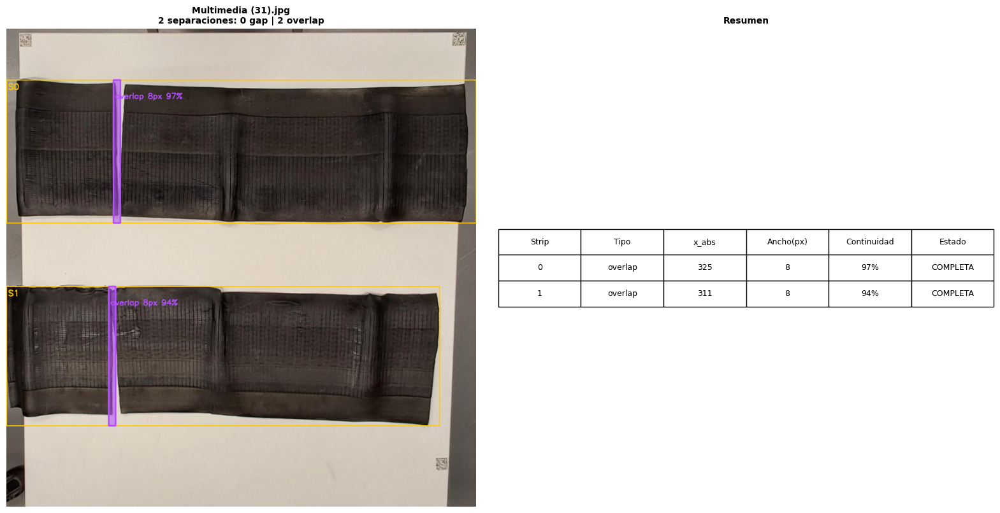


Separaciones:
  Strip 0 | overlap      | x_center=325  w=8px  97%  COMPLETA
  Strip 1 | overlap      | x_center=311  w=8px  94%  COMPLETA


In [ ]:
img_rgb, strips, separations = detect_separations(IMAGE_PATH, show=True)

print("\nSeparaciones:")
for s in separations:
    cx = (s['abs_x0'] + s['abs_x1']) // 2
    print(f"  Strip {s['strip_idx']} | {s['sep_type']:12s} | "
          f"x_center={cx}  w={s['width_px']}px  "
          f"{s['true_continuity']:.0%}  "
          f"{'COMPLETA' if s['is_complete'] else 'PARCIAL'}")

## Medición en mm (con homografía de QRs)

In [ ]:
def measure_separation_width_mm(sep, H_mat):
    """
    Convierte la anchura de la separación de píxeles a mm.
    Mide en el centro vertical del strip.
    """
    def px_to_mm(pt):
        p = np.array([pt[0], pt[1], 1.0])
        r = H_mat @ p
        return float(r[0]/r[2]), float(r[1]/r[2])

    cy = (sep['abs_y0'] + sep['abs_y1']) // 2
    p1 = px_to_mm((sep['abs_x0'], cy))
    p2 = px_to_mm((sep['abs_x1'], cy))
    width_mm = np.hypot(p2[0]-p1[0], p2[1]-p1[1])
    return width_mm, p1, p2


# Descomentar tras ejecutar detect_qrs y compute_homography:
# for sep in separations:
#     w_mm, p1, p2 = measure_separation_width_mm(sep, H_mat)
#     print(f"  {sep['sep_type']} ancho={w_mm:.2f} mm")

print("Módulo de medición listo.")

Módulo de medición listo.


## Evaluación sobre todo el dataset

Imágenes: 22
  Multimedia (31).jpg: 2 strips | 0 gap | 2 overlap | 0 parciales


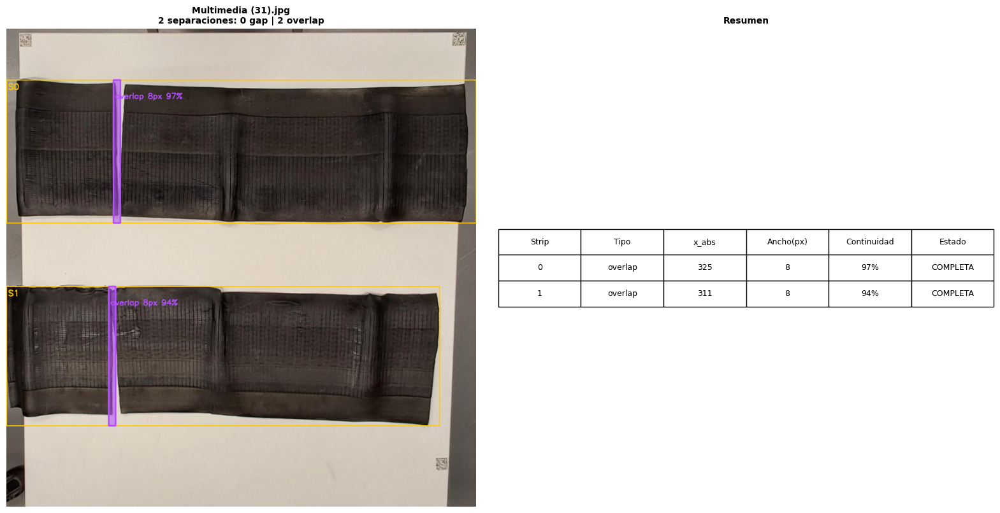

  Multimedia (32).jpg: 2 strips | 0 gap | 1 overlap | 0 parciales


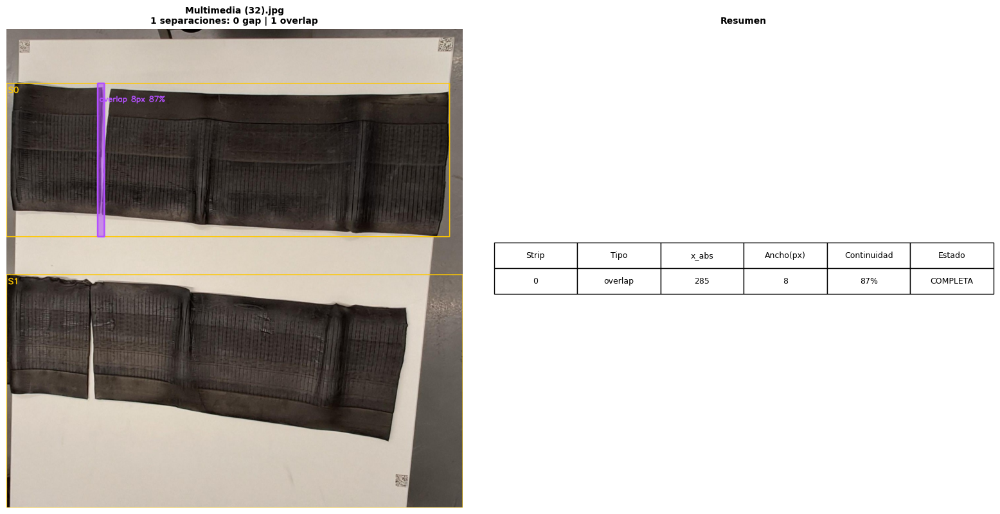

  Multimedia (33).jpg: 2 strips | 0 gap | 0 overlap | 0 parciales


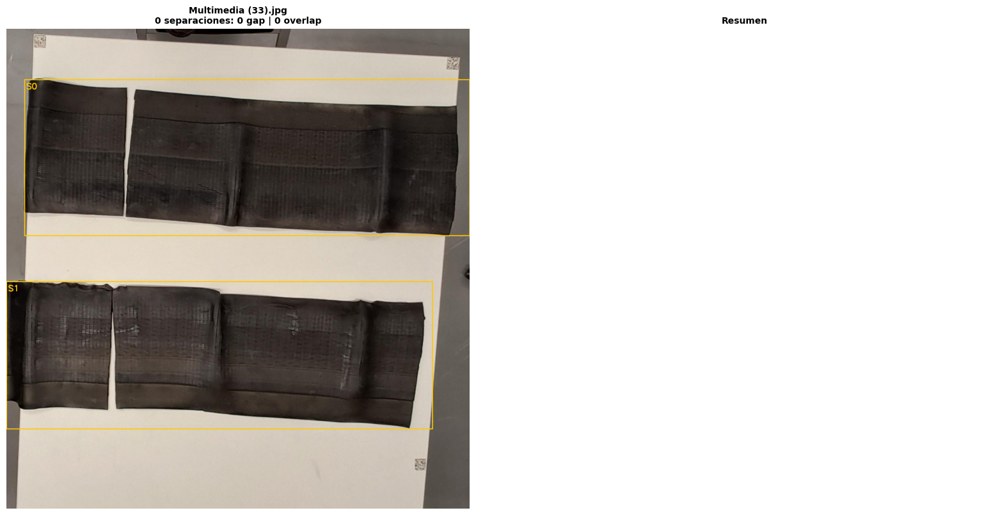

  Multimedia (34).jpg: 2 strips | 0 gap | 1 overlap | 0 parciales


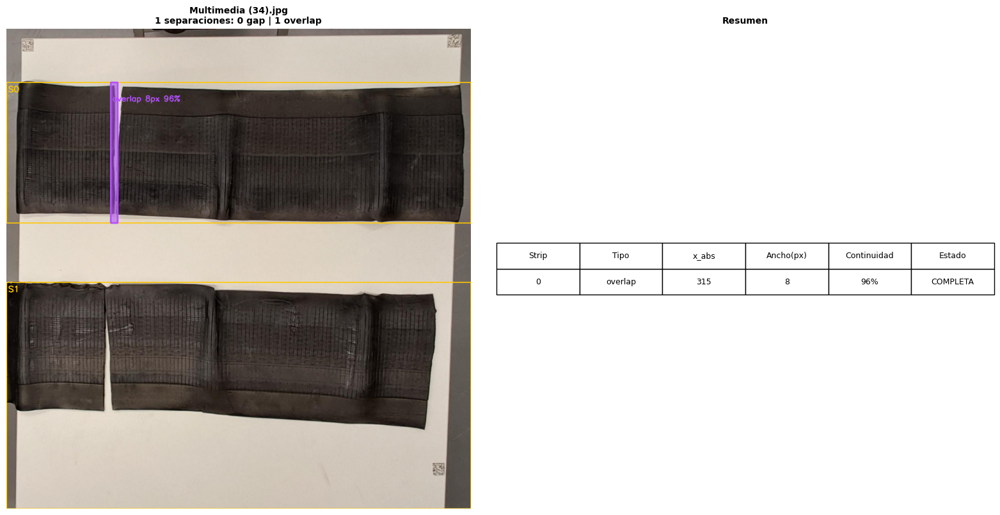

  Multimedia (35).jpg: 2 strips | 0 gap | 2 overlap | 0 parciales


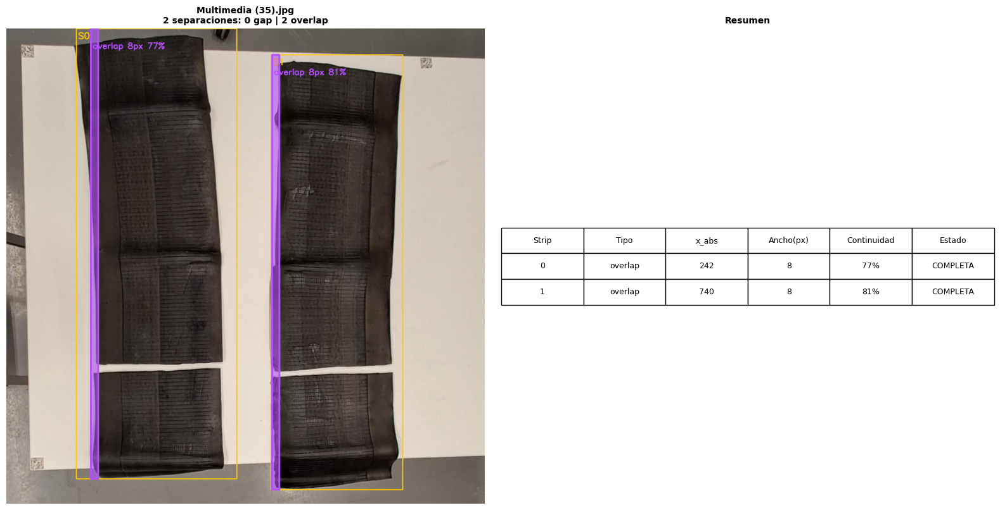

  Multimedia (36).jpg: 2 strips | 0 gap | 2 overlap | 0 parciales


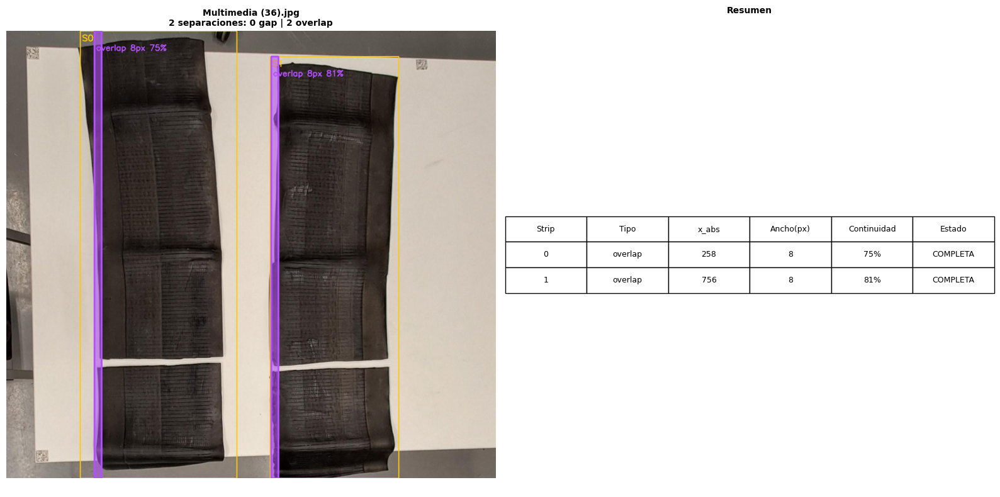

  Multimedia (37).jpg: 2 strips | 0 gap | 1 overlap | 0 parciales


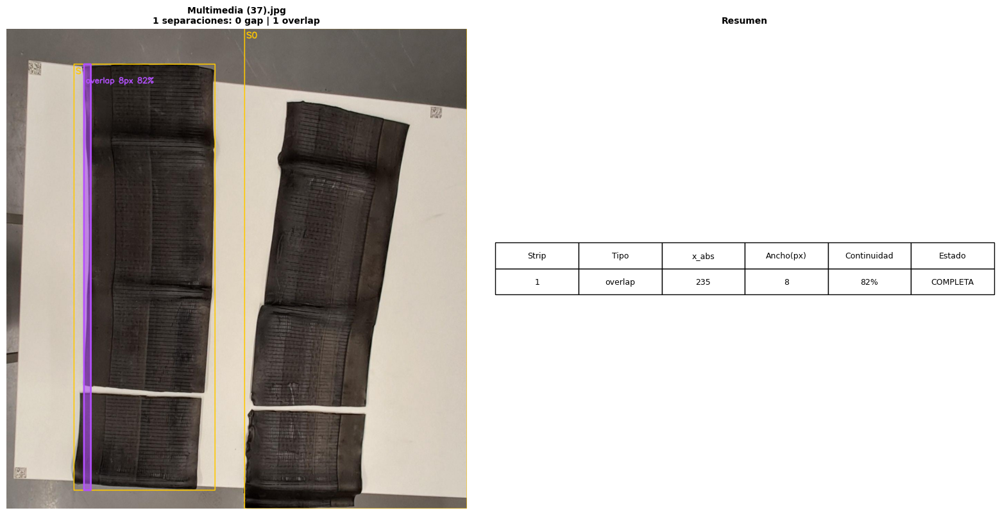

  Multimedia (38).jpg: 2 strips | 0 gap | 1 overlap | 0 parciales


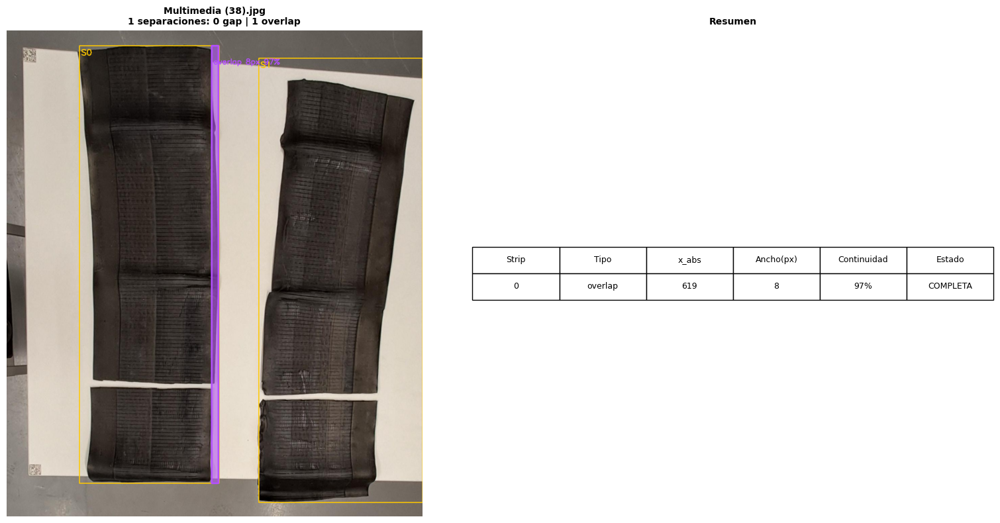

  Multimedia (39).jpg: 2 strips | 0 gap | 1 overlap | 0 parciales


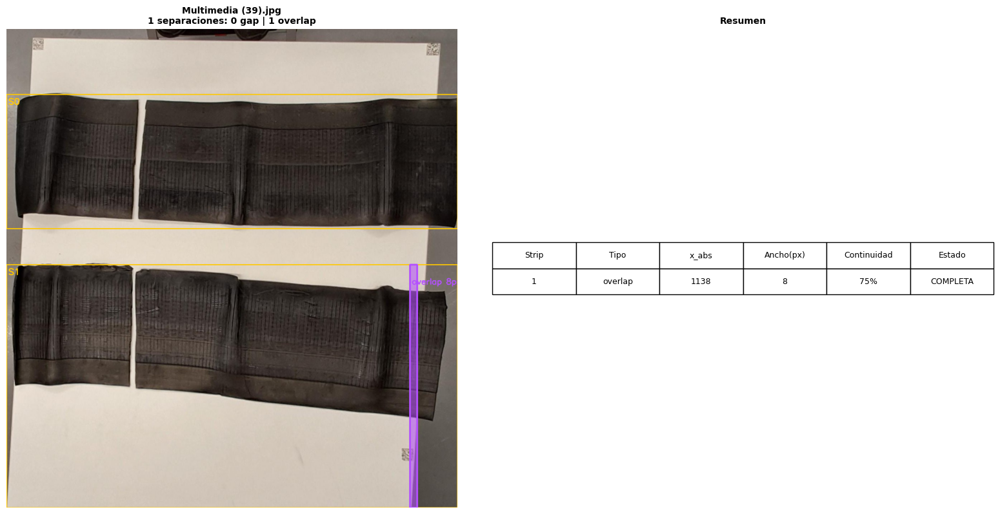

  Multimedia (40).jpg: 2 strips | 0 gap | 1 overlap | 0 parciales


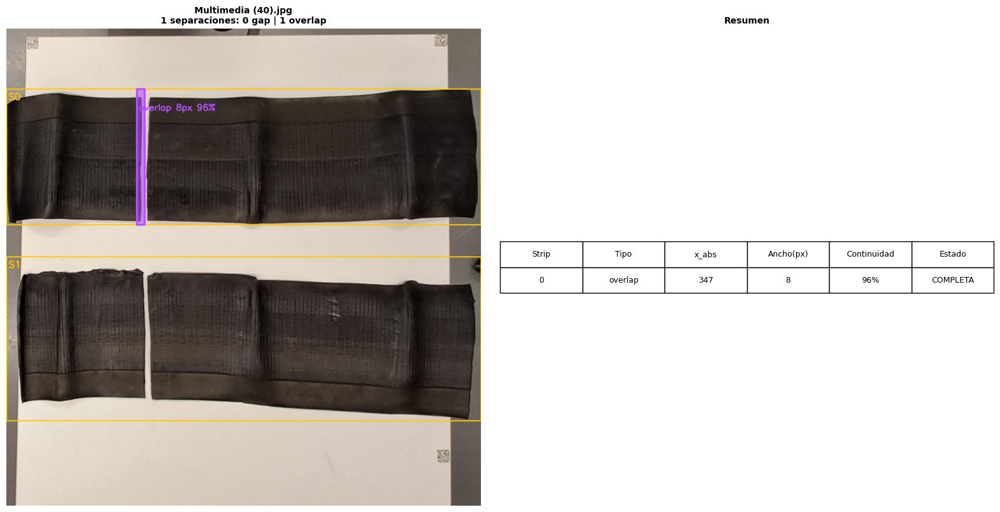

  Multimedia (41).jpg: 2 strips | 0 gap | 2 overlap | 0 parciales


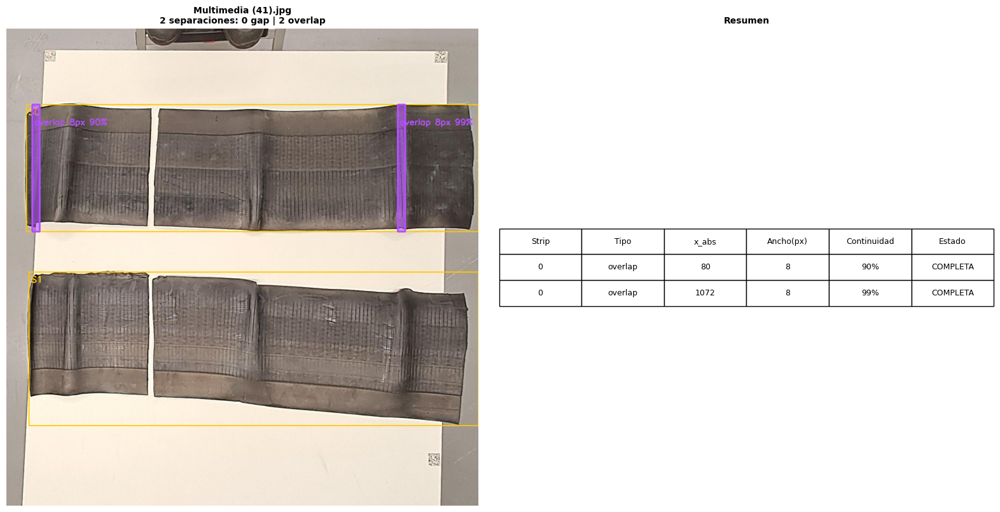

  Multimedia (42).jpg: 2 strips | 0 gap | 3 overlap | 0 parciales


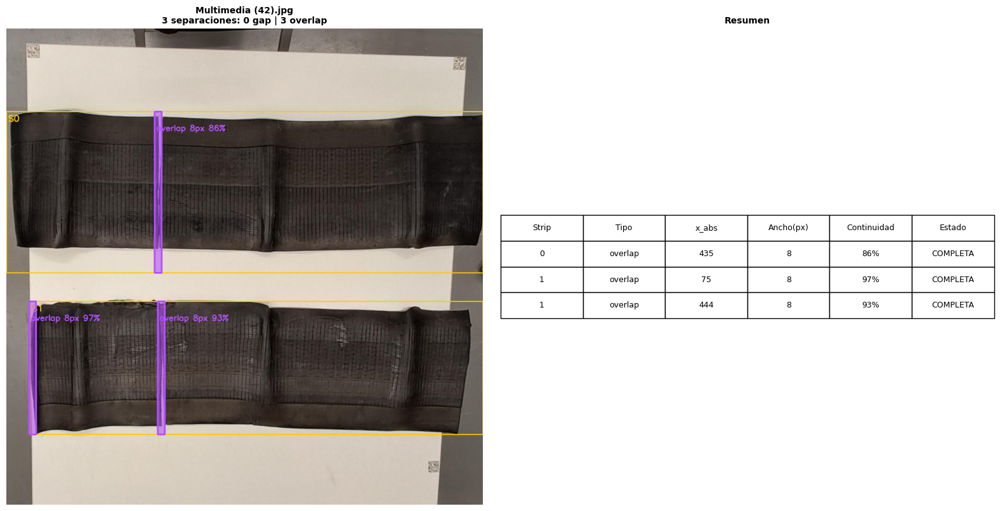

  Multimedia (43).jpg: 2 strips | 0 gap | 3 overlap | 0 parciales


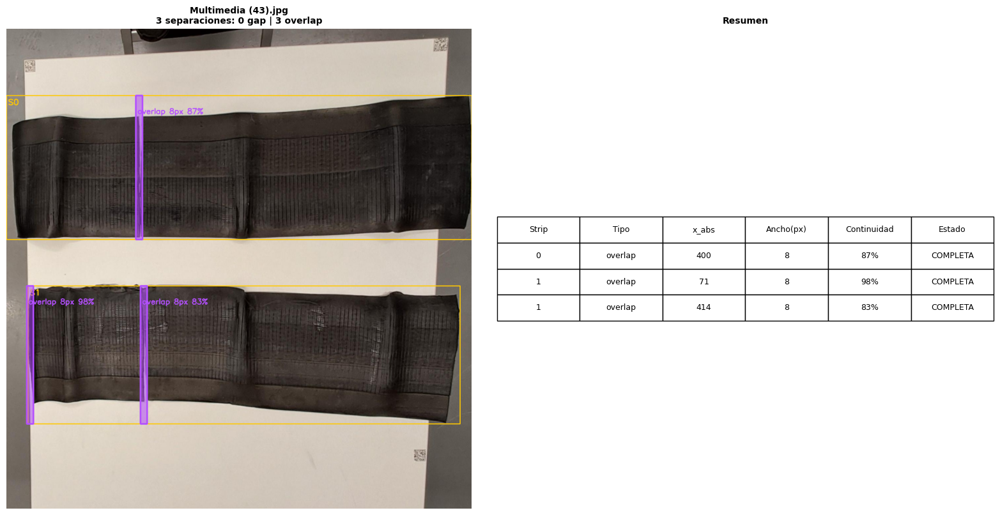

  Multimedia (44).jpg: 2 strips | 0 gap | 2 overlap | 0 parciales


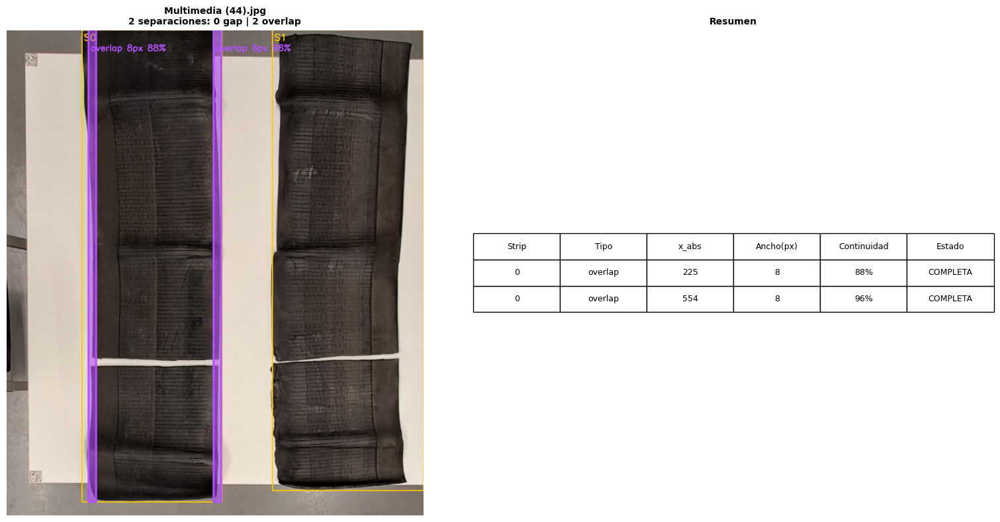

  Multimedia (45).jpg: 2 strips | 0 gap | 2 overlap | 0 parciales


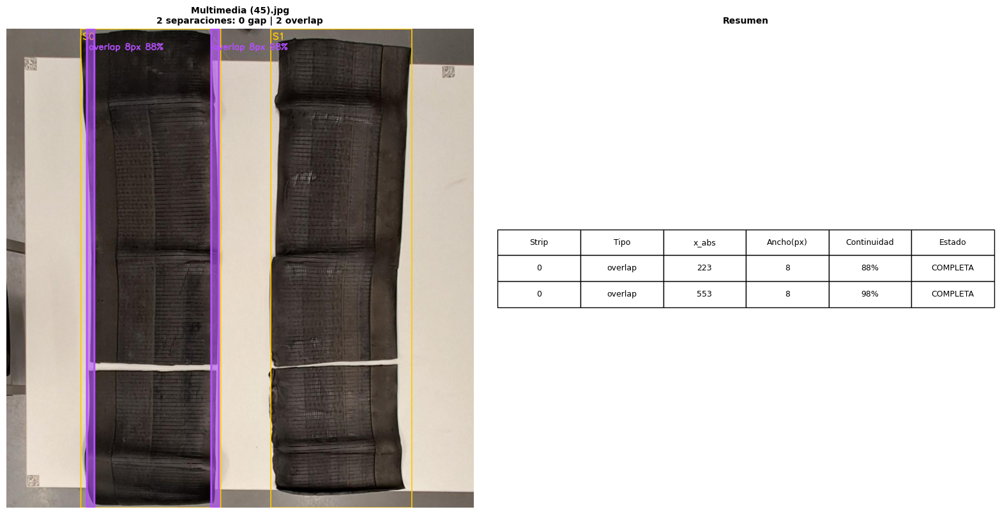

  Multimedia (46).jpg: 2 strips | 0 gap | 0 overlap | 0 parciales


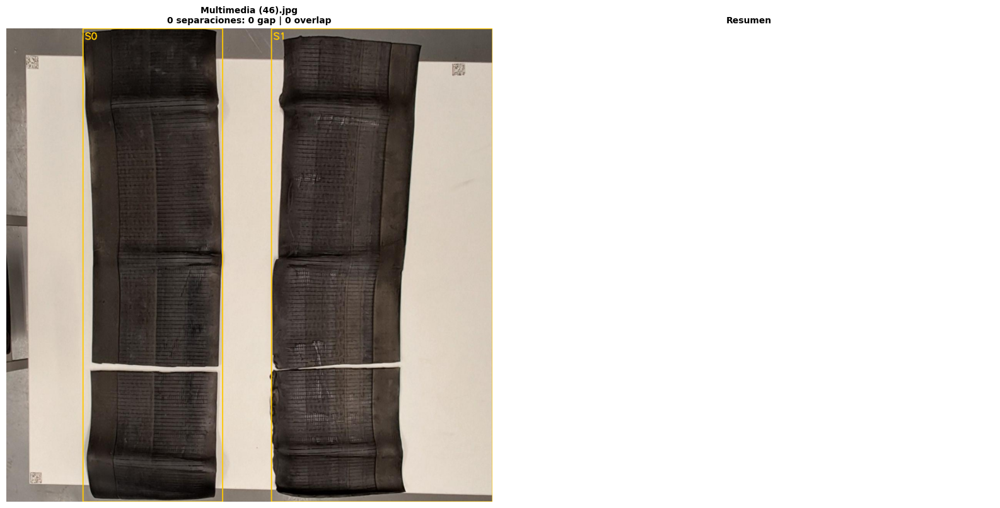

  Multimedia (47).jpg: 2 strips | 0 gap | 0 overlap | 0 parciales


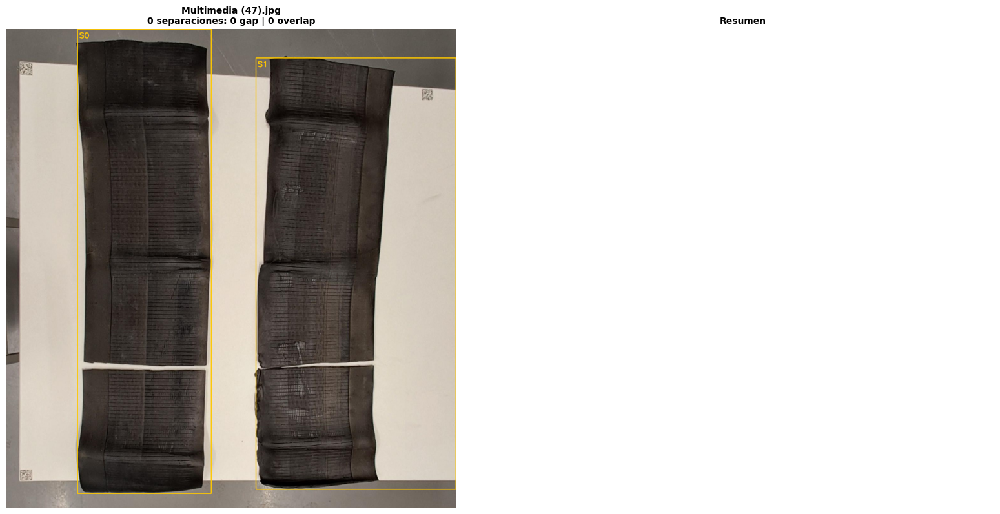

  Multimedia (48).jpg: 2 strips | 0 gap | 1 overlap | 0 parciales


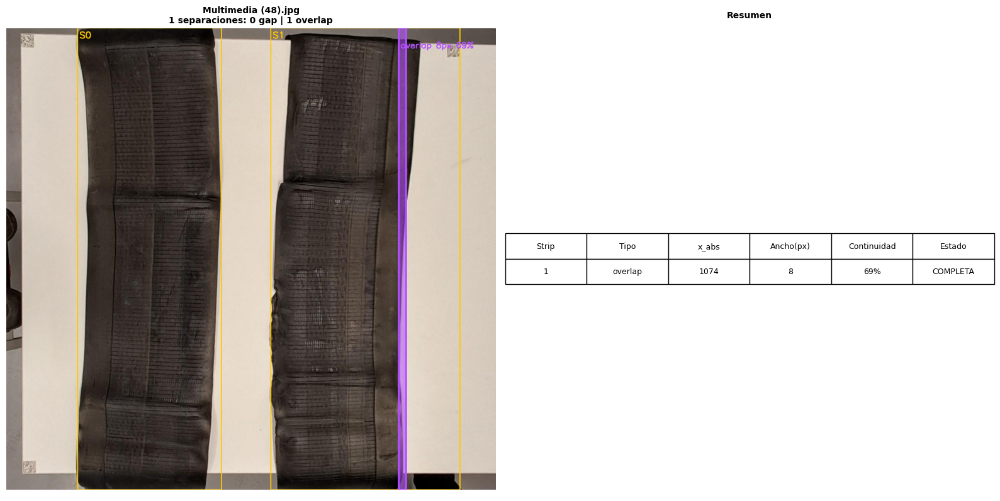

  Multimedia (49).jpg: 2 strips | 0 gap | 1 overlap | 0 parciales


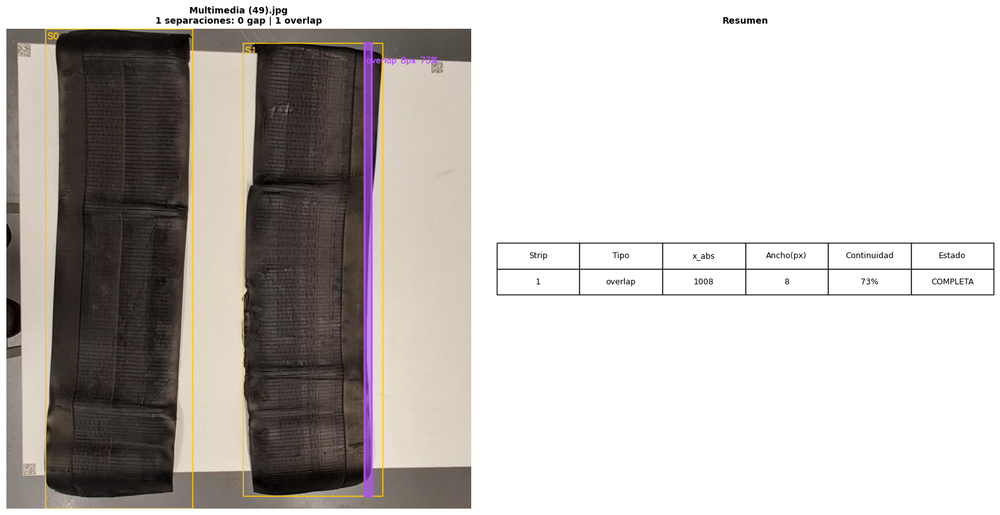

  Multimedia (50).jpg: 2 strips | 0 gap | 1 overlap | 0 parciales


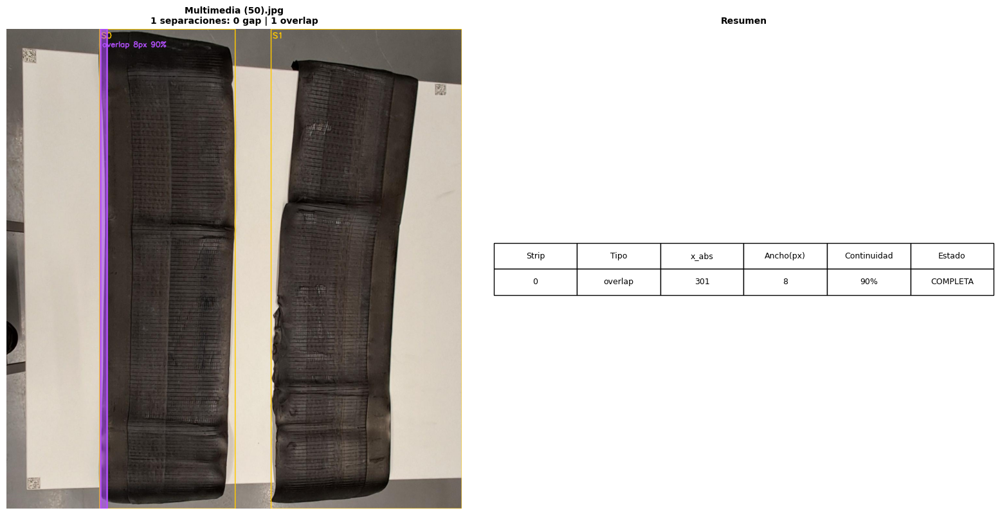

  Multimedia (51).jpg: 2 strips | 0 gap | 0 overlap | 0 parciales


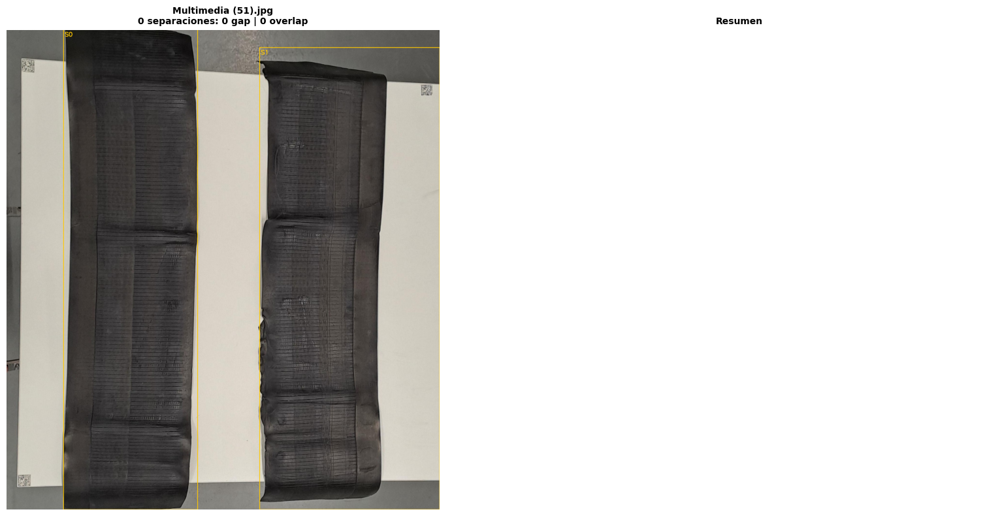

  Multimedia (52).jpg: 1 strips | 0 gap | 1 overlap | 1 parciales


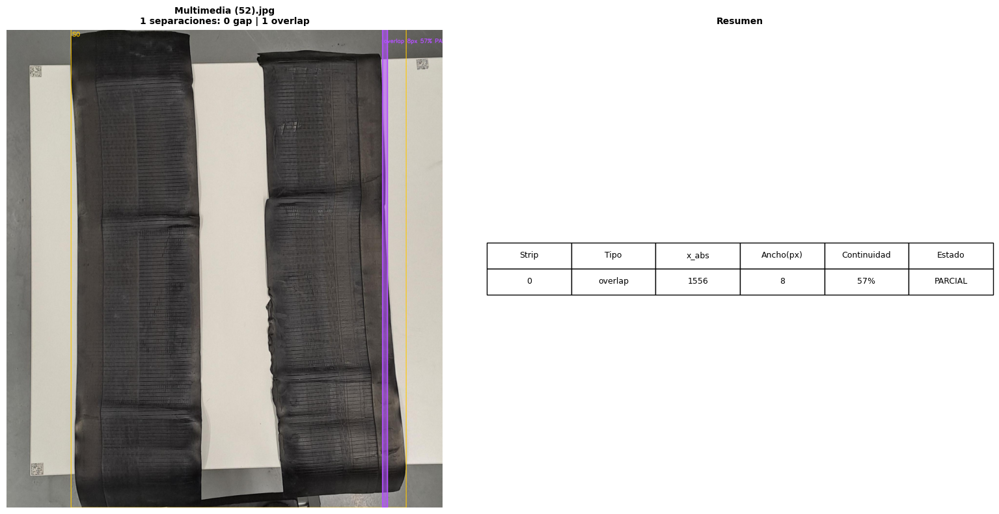

In [ ]:
image_paths = sorted(glob.glob(os.path.join(DATASET_PATH, "*.jpg")))
print(f"Imágenes: {len(image_paths)}")

for path in image_paths:
    fname = os.path.basename(path)
    try:
        _, strips_i, seps_i = detect_separations(path, show=False)
        gap  = [s for s in seps_i if 'gap'     in s['sep_type']]
        ovl  = [s for s in seps_i if 'overlap' in s['sep_type']]
        parc = [s for s in seps_i if not s['is_complete']]
        print(f"  {fname}: {len(strips_i)} strips | "
              f"{len(gap)} gap | {len(ovl)} overlap | {len(parc)} parciales")
    except Exception as e:
        print(f"  ERROR {fname}: {e}")

    # Visualizar todas las imágenes
    detect_separations(path, show=True)